In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import copy
import os
import torch.nn.functional as F
import torch.utils.data.dataloader as dataloader
from torch.utils.data import TensorDataset
from torch.autograd import Variable
from torchvision import transforms
from torchvision.datasets import CelebA
from torch.utils.data import Dataset
from PIL import Image
import zipfile
import random

# Set the random seed and device
SEED = 1
torch.manual_seed(SEED)
cuda = torch.cuda.is_available()
device = torch.device('cuda' if cuda else 'cpu')

# Define constants
BATCH_SIZE = 128
Z_DIM = 300
NUM_EPOCHS = 120
LOG_INTERVAL = 50
SAVE_PATH = "model.pth"
DATA_DIR = "/content/sample_data/archive.zip"
LOSS_THRESHOLD = 0.01
NUM_MODELS = 10

class CustomDataset(Dataset):
    def __init__(self, root_zip, transform=None):
        self.root_zip = root_zip
        self.transform = transform
        self.image_paths = self.extract_zip(root_zip)
        random.shuffle(self.image_paths)  # Shuffle the image paths

    def extract_zip(self, root_zip):
        # Extract the ZIP file
        extract_dir = '/content/extracted_images'  # Main directory where the zip is extracted
        sub_dir = 'celeba_hq_256'  # Subdirectory containing the images
        full_extract_dir = os.path.join(extract_dir, sub_dir)  # Full path to the images
        with zipfile.ZipFile(root_zip, 'r') as zip_ref:
            zip_ref.extractall(extract_dir)

        # List image files in the subdirectory
        image_paths = [os.path.join(full_extract_dir, filename)
                       for filename in os.listdir(full_extract_dir)
                       if os.path.isfile(os.path.join(full_extract_dir, filename))]
        return image_paths

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_name = self.image_paths[idx]
        image = Image.open(img_name).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, 0

# Define the transform for image preprocessing
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

# Create a custom dataset
custom_dataset = CustomDataset(DATA_DIR, transform=transform)

total_size = len(custom_dataset)
train_size = int(0.8 * total_size)
test_size = total_size - train_size

train_dataset, test_dataset = torch.utils.data.random_split(custom_dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)

def plot_images(original_images, reconstructed_images, n=10):
    original_images = original_images.cpu().numpy().squeeze()
    reconstructed_images = reconstructed_images.cpu().detach().numpy().squeeze()

    plt.figure(figsize=(20, 4))
    for i in range(n):
        # Display original images
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original_images[i], cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # Display reconstruction images
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed_images[i], cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

# Define the GumbelSoftmaxVAE model
class GumbelSoftmaxVAE(nn.Module):
    def __init__(self, tau_1=1.0, tau_2=1.0):
        super().__init__()

        self.tau_1 = tau_1
        self.tau_2 = tau_2

        # Encoder
        self.conv1 = nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)

        # Two layers of latent variables
        self.fc_logits_z1 = nn.Linear(256 * 8 * 8, Z_DIM)  # Modify input size
        self.fc_logits_z2 = nn.Linear(Z_DIM, Z_DIM)

        # Decoder for each layer
        self.fc_dec1 = nn.Linear(Z_DIM, 256 * 8 * 8)  # Modify output size
        self.fc_dec2 = nn.Linear(Z_DIM, 128 * 16 * 16)  # Modify input size

        self.conv_trans1_1 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)
        self.conv_trans2_1 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.conv_trans3_1 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.conv_trans4_1 = nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1)

        self.conv_trans1_2 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.conv_trans2_2 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.conv_trans3_2 = nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1)

    def encode(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = x.view(x.size(0), -1)

        logits_z1 = self.fc_logits_z1(x)
        logits_z2 = self.fc_logits_z2(logits_z1)

        return logits_z1, logits_z2

    def reparameterize(self, logits, tau):
        gumbel_noise = torch.rand_like(logits).to(device)
        gumbel_noise = -torch.log(-torch.log(gumbel_noise + 1e-8) + 1e-8)
        z = (logits + gumbel_noise) / tau
        z = F.softmax(z, dim=-1)
        return z

    def decode1(self, z):
        z = self.fc_dec1(z)
        z = z.view(z.size(0), 256, 8, 8)  # reshape to match the new input size
        z = F.relu(self.conv_trans1_1(z))
        z = F.relu(self.conv_trans2_1(z))
        z = F.relu(self.conv_trans3_1(z))
        z = torch.sigmoid(self.conv_trans4_1(z))
        return z

    def decode2(self, z):
        z = self.fc_dec2(z)
        z = z.view(z.size(0), 128, 16, 16)  # reshape to match the new input size
        z = F.relu(self.conv_trans1_2(z))
        z = F.relu(self.conv_trans2_2(z))
        z = torch.sigmoid(self.conv_trans3_2(z))
        return z

    def forward(self, x):
        logits_z1, logits_z2 = self.encode(x)
        z1 = self.reparameterize(logits_z1, self.tau_1)
        z2 = self.reparameterize(logits_z2, self.tau_2)

        x_hat1 = self.decode1(z1)
        x_hat2 = self.decode2(z2)

        # Average the output of the two decoders
        x_hat = (x_hat1 + x_hat2) / 2.0

        return x_hat, logits_z1, logits_z2, z1, z2

    def gumbel_softmax_loss_function(self, recon_x, x, logits_z1, logits_z2, z1, z2):
        # Binary cross entropy
        xent_loss = F.binary_cross_entropy(recon_x, x, reduction='none')
        xent_loss = torch.sum(xent_loss, dim=[1, 2, 3])

        # KL divergence for each layer
        p_z1 = F.softmax(logits_z1, dim=-1)
        p_z1 = torch.clamp(p_z1, torch.finfo(p_z1.dtype).eps, 1. - torch.finfo(p_z1.dtype).eps)  # to prevent log(0)
        kl_loss_z1 = torch.sum(p_z1 * torch.log(p_z1 * Z_DIM + torch.finfo(p_z1.dtype).eps), dim=-1)

        p_z2 = F.softmax(logits_z2, dim=-1)
        p_z2 = torch.clamp(p_z2, torch.finfo(p_z2.dtype).eps, 1. - torch.finfo(p_z2.dtype).eps)  # to prevent log(0)
        kl_loss_z2 = torch.sum(p_z2 * torch.log(p_z2 * Z_DIM + torch.finfo(p_z2.dtype).eps), dim=-1)

        # Total loss is the sum of the losses for each layer
        vae_loss = torch.mean(xent_loss + kl_loss_z1 + kl_loss_z2)
        return vae_loss

# Initialize models and optimizers
models = [GumbelSoftmaxVAE().to(device) for _ in range(NUM_MODELS)]
optimizers = [optim.Adam(model.parameters(), lr=1e-3) for model in models]

# Initialize temperature strategies
initial_taus = [1.0 for _ in range(NUM_MODELS)]
temp_strategies = ['fixed', 'linear_increase', 'linear_decrease', 'exp_increase', 'exp_decrease']
temp_strategies_extended = ['fixed'] + temp_strategies * ((NUM_MODELS - 1) // len(temp_strategies)) + temp_strategies[:((NUM_MODELS - 1) % len(temp_strategies))]
tau_min, tau_max = 0.5, 300
lin_increase, lin_decrease = 1., 0.3
exp_increase, exp_decrease = 1.05, 0.95
learning_rate = 0.01
patience_threshold = 5
patience_counter = [0 for _ in range(NUM_MODELS)]

# Ensure temp_strategies_extended has correct length
assert len(temp_strategies_extended) == NUM_MODELS, f"Expected {NUM_MODELS} strategies, got {len(temp_strategies_extended)}"

best_tau_per_epoch_1 = []  # To record the best tau_1 for each epoch
best_tau_per_epoch_2 = []  # To record the best tau_2 for each epoch

for epoch in range(NUM_EPOCHS):
    losses = []
    best_reconstruction = None  # Keep track of the best reconstruction
    original_images = None

    for i in range(NUM_MODELS):
        model = models[i]
        temp_strategy = temp_strategies_extended[i]

        if temp_strategy == 'fixed':
            model.tau_1 = nn.Parameter(torch.tensor(initial_taus[i]), requires_grad=True)
            model.tau_2 = nn.Parameter(torch.tensor(initial_taus[i]), requires_grad=True)
        elif temp_strategy == 'linear_increase':
            model.tau_1 = nn.Parameter(torch.tensor(min(initial_taus[i] + epoch * lin_increase, tau_max)), requires_grad=True)
            model.tau_2 = nn.Parameter(torch.tensor(min(initial_taus[i] + epoch * lin_increase, tau_max)), requires_grad=True)
        elif temp_strategy == 'linear_decrease':
            model.tau_1 = nn.Parameter(torch.tensor(max(initial_taus[i] - epoch * lin_decrease, tau_min)), requires_grad=True)
            model.tau_2 = nn.Parameter(torch.tensor(max(initial_taus[i] - epoch * lin_decrease, tau_min)), requires_grad=True)
        elif temp_strategy == 'exp_increase':
            model.tau_1 = nn.Parameter(torch.tensor(min(initial_taus[i] * (exp_increase ** epoch), tau_max)), requires_grad=True)
            model.tau_2 = nn.Parameter(torch.tensor(min(initial_taus[i] * (exp_increase ** epoch), tau_max)), requires_grad=True)
        elif temp_strategy == 'exp_decrease':
            model.tau_1 = nn.Parameter(torch.tensor(max(initial_taus[i] * (exp_decrease ** epoch), tau_min)), requires_grad=True)
            model.tau_2 = nn.Parameter(torch.tensor(max(initial_taus[i] * (exp_decrease ** epoch), tau_min)), requires_grad=True)

        epoch_loss = 0.0

        for batch_idx, (data, _) in enumerate(train_loader):
            data = data.to(device)
            optimizers[i].zero_grad()
            recon_batch, logits_z1, logits_z2, z1, z2 = model(data)
            loss = model.gumbel_softmax_loss_function(recon_batch, data, logits_z1, logits_z2, z1, z2)
            loss.backward()
            optimizers[i].step()
            epoch_loss += loss.item()

            if epoch_loss < LOSS_THRESHOLD and (best_reconstruction is None or loss.item() < min(losses)):
                best_reconstruction = recon_batch
                original_images = data

        epoch_loss /= len(train_loader)
        losses.append(epoch_loss)
        print(f'Train Epoch: {epoch} \tModel: {i} \tTraining Loss: {epoch_loss} \tTemperature Strategy: {temp_strategy}')

    best_model_idx = np.argmin(losses)
    best_loss = losses[best_model_idx]

    for i in range(NUM_MODELS):
        if i != best_model_idx:
            if losses[i] > best_loss:
                patience_counter[i] += 1
                if patience_counter[i] >= patience_threshold:
                    delta_tau = learning_rate * (losses[i] - best_loss)  # positive item
                    models[i].tau_1 = nn.Parameter(torch.tensor(min(models[i].tau_1.item() + delta_tau, tau_max)), requires_grad=True)
                    models[i].tau_2 = nn.Parameter(torch.tensor(min(models[i].tau_2.item() + delta_tau, tau_max)), requires_grad=True)
                    patience_counter[i] = 0

    if min(losses) < LOSS_THRESHOLD:
        best_model_state_dict = copy.deepcopy(models[best_model_idx].state_dict())
        for i in range(NUM_MODELS):
            if i != best_model_idx:
                models[i].load_state_dict(best_model_state_dict)
                models[i].tau_1 = models[best_model_idx].tau_1
                models[i].tau_2 = models[best_model_idx].tau_2

    best_tau_per_epoch_1.append(models[best_model_idx].tau_1.item())
    best_tau_per_epoch_2.append(models[best_model_idx].tau_2.item())

    if best_reconstruction is not None and original_images is not None:
        plot_images(original_images.cpu(), best_reconstruction.cpu())

# Output the best tau for each epoch
for epoch, (tau_1, tau_2) in enumerate(zip(best_tau_per_epoch_1, best_tau_per_epoch_2)):
    print(f"Epoch: {epoch}, Best Tau 1: {tau_1}, Best Tau 2: {tau_2}")

# Plot the best_tau_per_epoch
plt.figure(figsize=(12, 8))
plt.plot(range(NUM_EPOCHS), best_tau_per_epoch_1, label='Best Tau 1 per Epoch')
plt.plot(range(NUM_EPOCHS), best_tau_per_epoch_2, label='Best Tau 2 per Epoch')
plt.xlabel('Epochs')
plt.ylabel('Tau values')
plt.title('Best Tau Values per Epoch')
plt.legend()
plt.show()


Train Epoch: 0 	Model: 0 	Training Loss: 30119.360787898935 	Temperature Strategy: fixed
Train Epoch: 0 	Model: 1 	Training Loss: 30238.477663730053 	Temperature Strategy: fixed
Train Epoch: 0 	Model: 2 	Training Loss: 29824.052027925532 	Temperature Strategy: linear_increase
Train Epoch: 0 	Model: 3 	Training Loss: 30677.0083423371 	Temperature Strategy: linear_decrease
Train Epoch: 0 	Model: 4 	Training Loss: 30106.878490691488 	Temperature Strategy: exp_increase
Train Epoch: 0 	Model: 5 	Training Loss: 30483.84751080452 	Temperature Strategy: exp_decrease
Train Epoch: 0 	Model: 6 	Training Loss: 30602.238405917553 	Temperature Strategy: fixed
Train Epoch: 0 	Model: 7 	Training Loss: 30370.396847988697 	Temperature Strategy: linear_increase
Train Epoch: 0 	Model: 8 	Training Loss: 29941.85575964096 	Temperature Strategy: linear_decrease
Train Epoch: 0 	Model: 9 	Training Loss: 30338.315253075132 	Temperature Strategy: exp_increase
Train Epoch: 1 	Model: 0 	Training Loss: 28404.325247

RuntimeError: Only Tensors of floating point and complex dtype can require gradients

In [ ]:
# index 9 means the model 9 by using exponential increasing temperature strategy
best_model_path = './best_model_celebaHD_parallel.pth'

torch.save(models[best_model_idx].state_dict(), best_model_path)
print(f'Best model saved with index: {best_model_idx}')

Best model saved with index: 9


In [ ]:
#Print best model's tau_1 and tau_2
print(models[best_model_idx].tau_1)
print(models[best_model_idx].tau_2)

Parameter containing:
tensor(287.0508, requires_grad=True)
Parameter containing:
tensor(287.0508, requires_grad=True)


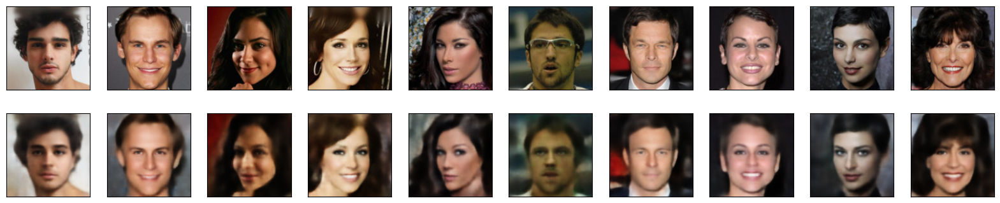

In [ ]:
# Test our proposed model using the exponential increasing temperature on CelebA HD
def plot_images(original_images, reconstructed_images, n=10):
    original_images = original_images.cpu().numpy()
    reconstructed_images = reconstructed_images.cpu().detach().numpy()

    plt.figure(figsize=(20, 4))
    for i in range(n):
        # Display original images
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original_images[i].transpose(1, 2, 0))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # Display reconstruction images
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed_images[i].transpose(1, 2, 0))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()


# Choose a random batch of images from the test dataset
data, _ = next(iter(test_loader))
data = data.to(device)

# Pass the images through the best model
recon_batch, _, _, _, _ = models[best_model_idx](data)

# Plot the original and reconstructed images
plot_images(data.cpu(), recon_batch.cpu())


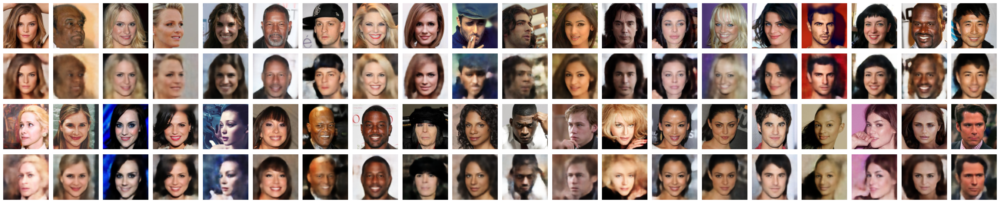

In [ ]:
# Test reconstruction of our proposed model using the exponential increasing temperature on CelebA HD
import torch
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchvision import datasets, transforms


# Define the transform for image preprocessing
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])


test_loader = DataLoader(test_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)


def plot_images(test_loader, model, device, rows=2, cols=20):
    # Get the first batch of images
    data_1, _ = next(iter(test_loader))
    data_1 = data_1.to(device)
    recon_batch_1, _, _, _, _ = model(data_1)

    # Get the second batch of images
    data_2, _ = next(iter(test_loader))
    data_2 = data_2.to(device)
    recon_batch_2, _, _, _, _  = model(data_2)

    # Convert to numpy arrays
    original_images_1 = data_1.cpu().numpy()
    reconstructed_images_1 = recon_batch_1.cpu().detach().numpy()
    original_images_2 = data_2.cpu().numpy()
    reconstructed_images_2 = recon_batch_2.cpu().detach().numpy()

    # Plotting
    fig, axes = plt.subplots(nrows=2 * rows, ncols=cols, figsize=(2 * cols, 4 * rows))
    for i in range(cols):
        # Display first set of original images in the first row
        axes[0, i].imshow(original_images_1[i].transpose(1, 2, 0))
        axes[0, i].axis('off')

        # Display first set of reconstructed images in the second row
        axes[1, i].imshow(reconstructed_images_1[i].transpose(1, 2, 0))
        axes[1, i].axis('off')

        # Display second set of original images in the third row
        axes[2, i].imshow(original_images_2[i].transpose(1, 2, 0))
        axes[2, i].axis('off')

        # Display second set of reconstructed images in the fourth row
        axes[3, i].imshow(reconstructed_images_2[i].transpose(1, 2, 0))
        axes[3, i].axis('off')

    plt.subplots_adjust(wspace=0.1, hspace=0.1)  # Adjust the spacing between images
    plt.show()

plot_images(test_loader, models[best_model_idx], device)


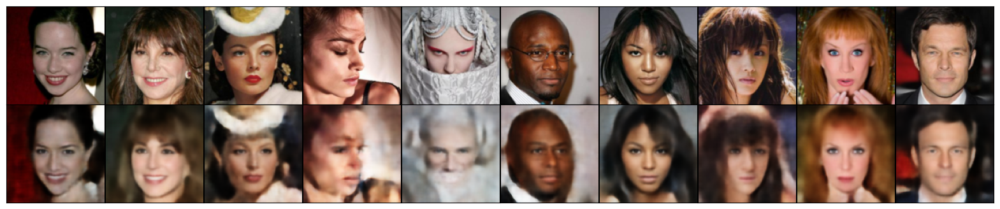

MSE between original and reconstructed images: 0.0039711007848382


In [ ]:
#Find MSE of reconstruction by using our model
import numpy as np
import torch
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import torch.nn.functional as F

# Function to add Gaussian noise to images
def add_gaussian_noise(images, mean=0.0, std=0.0):
    noise = np.random.normal(mean, std, images.shape)
    noisy_images = images + noise
    return np.clip(noisy_images, 0, 1)

def plot_images(noisy_images, reconstructed_images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        # Display noisy images
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(noisy_images[i].transpose(1, 2, 0))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # Display reconstructed images
        ax = plt.subplot(2, n, i + n + 1)
        plt.imshow(reconstructed_images[i].transpose(1, 2, 0))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

# Function to calculate MSE between original and reconstructed images
def calculate_mse(original, reconstructed):
    return F.mse_loss(torch.tensor(original), torch.tensor(reconstructed))

data, _ = next(iter(test_loader))
data = data.to(device)

# Generate noisy images
noisy_data = add_gaussian_noise(data.cpu().numpy())
noisy_data_tensor = torch.tensor(noisy_data).float().to(device)
recon_batch, _, _, _, _ = models[best_model_idx](noisy_data_tensor)

# Plot noisy and reconstructed images
plot_images(noisy_data, recon_batch.cpu().detach().numpy(), n=10)

# Calculate and print MSE
mse_value = calculate_mse(data.cpu().numpy(), recon_batch.cpu().detach().numpy())
print(f"MSE between original and reconstructed images: {mse_value.item()}")


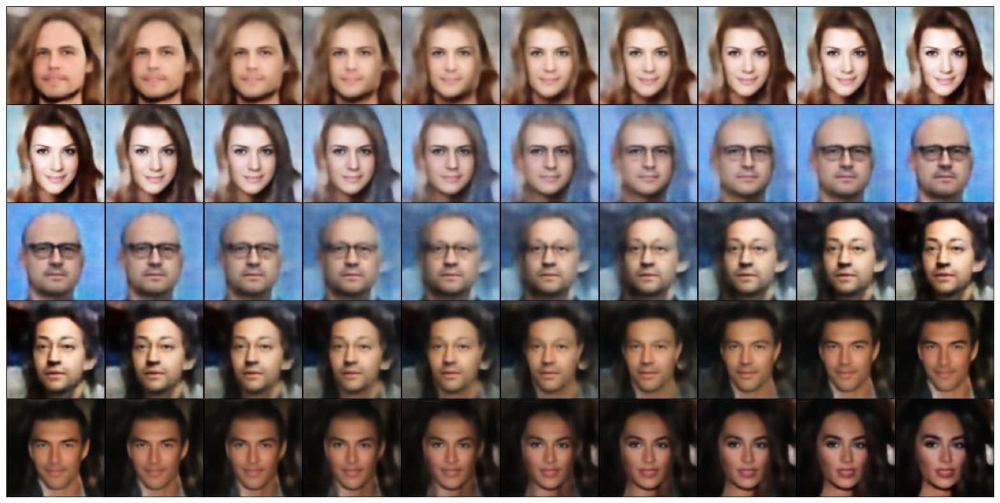

In [ ]:
# Test interpolated images of our proposed model
import torch
import matplotlib.pyplot as plt

# Function to plot images in rows as a single figure
def plot_interpolated_images(images_list):
    num_rows = len(images_list)
    num_cols = len(images_list[0])
    plt.figure(figsize=(2 * num_cols, 2 * num_rows))
    for row, images in enumerate(images_list):
        for col, image in enumerate(images):
            ax = plt.subplot(num_rows, num_cols, row * num_cols + col + 1)
            plt.imshow(image.transpose(1, 2, 0))
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

# Function to interpolate between two images
def interpolate_images(image1, image2, steps=10):
    interpolated_images = []
    for alpha in torch.linspace(0, 1, steps):
        interpolated_image = (1 - alpha) * image1 + alpha * image2
        interpolated_images.append(interpolated_image.unsqueeze(0))
    return torch.cat(interpolated_images, dim=0)

data, _ = next(iter(test_loader))
data = data.to(device)
selected_data = data[4:10]

# Interpolate between each pair of selected images
interpolated_data_list = []
for i in range(len(selected_data) - 1):
    interpolated_data = interpolate_images(selected_data[i], selected_data[i + 1])
    with torch.no_grad():
        recon_interpolated = models[best_model_idx](interpolated_data)[0]
    interpolated_data_list.append(recon_interpolated.cpu().numpy())

# Plot the interpolated images
plot_interpolated_images(interpolated_data_list)

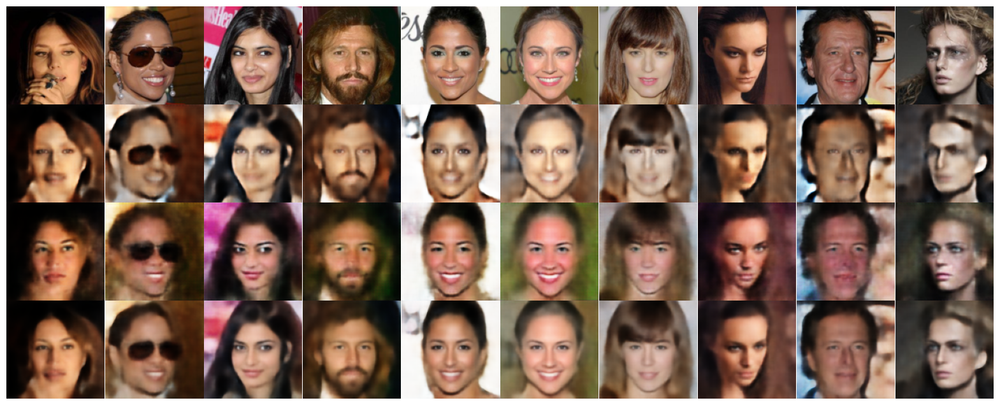

In [ ]:
# Test each layer's contribution of our proposed model using the exponential increasing temperature on CelebA HD
def plot_images_from_layers_and_reconstruction(data, model):
    with torch.no_grad():  # Ensure we're in no_grad mode when doing inference
        logits_z1, logits_z2 = model.encode(data)
        z1 = model.reparameterize(logits_z1, model.tau_1)
        z2 = model.reparameterize(logits_z2, model.tau_2)
        recon_images_layer1 = model.decode1(z1)
        recon_images_layer2 = model.decode2(z2)
        # Combine the layers to create the final reconstruction
        final_reconstruction = (recon_images_layer1 + recon_images_layer2) / 2.0

        # Plot images
        fig, axes = plt.subplots(4, 10, figsize=(20, 8))
        plt.subplots_adjust(wspace=0, hspace=0)  # Remove whitespace

        for i in range(10):
            # Original images
            axes[0, i].imshow(data[i].cpu().permute(1, 2, 0))
            axes[0, i].axis('off')
            # Reconstructed images from layer 1
            axes[1, i].imshow(recon_images_layer1[i].cpu().permute(1, 2, 0))
            axes[1, i].axis('off')
            # Reconstructed images from layer 2
            axes[2, i].imshow(recon_images_layer2[i].cpu().permute(1, 2, 0))
            axes[2, i].axis('off')
            # Final reconstructed images
            axes[3, i].imshow(final_reconstruction[i].cpu().permute(1, 2, 0))
            axes[3, i].axis('off')

        plt.show()


plot_images_from_layers_and_reconstruction(data, models[best_model_idx])


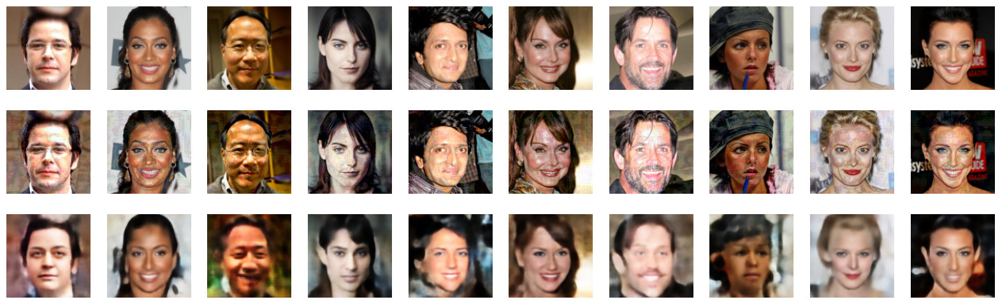

In [ ]:
# Test reconstruction of our proposed model under FGSM attack
# The model uses the exponential increasing temperature strategy
# Attack intensity is 0.05
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

# Define the FGSM attack function
def fgsm_attack(image, epsilon, data_grad):
    sign_data_grad = data_grad.sign()
    perturbed_image = image + epsilon * sign_data_grad
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    return perturbed_image

# Epsilon value for the FGSM attack
epsilon = 0.05 # intensity of FGSM attack
best_model = models[best_model_idx]
best_model.eval()

data, _ = next(iter(test_loader))
data = data.to(device)
data.requires_grad = True

# Forward pass
reconstructed_images = best_model(data)[0]
loss = F.mse_loss(reconstructed_images, data)

# Zero all existing gradients
best_model.zero_grad()

# Calculate gradients of model in backward pass
loss.backward()

# Collect the data gradients
data_grad = data.grad.data

# Call FGSM Attack
perturbed_data = fgsm_attack(data, epsilon, data_grad)

# Reconstruct images using the best model
recon_batch = best_model(perturbed_data)[0]

# Plot the original, adversarial, and reconstructed images
plt.figure(figsize=(20, 6))
for i in range(10):
    # Original images
    ax = plt.subplot(3, 10, i + 1)
    plt.imshow(data[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

    # Adversarial examples
    ax = plt.subplot(3, 10, i + 11)
    plt.imshow(perturbed_data[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

    # Reconstructed images
    ax = plt.subplot(3, 10, i + 21)
    plt.imshow(recon_batch[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

plt.show()

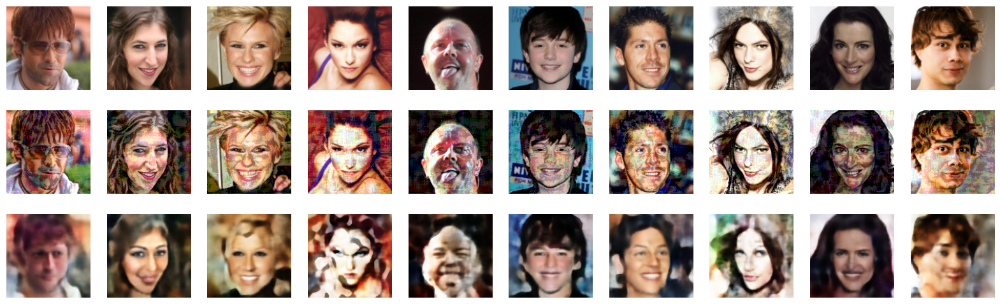

In [ ]:
# Test reconstruction of our proposed model under FGSM attack
# The model uses the exponential increasing temperature strategy
# Attack intensity is 0.1
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

# Define the FGSM attack function
def fgsm_attack(image, epsilon, data_grad):
    sign_data_grad = data_grad.sign()
    perturbed_image = image + epsilon * sign_data_grad
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    return perturbed_image

# Epsilon value for the FGSM attack
epsilon = 0.1 # intensity of FGSM attack
best_model = models[best_model_idx]
best_model.eval()

data, _ = next(iter(test_loader))
data = data.to(device)
data.requires_grad = True

# Forward pass
reconstructed_images = best_model(data)[0]
loss = F.mse_loss(reconstructed_images, data)

# Zero all existing gradients
best_model.zero_grad()

# Calculate gradients of model in backward pass
loss.backward()

# Collect the data gradients
data_grad = data.grad.data

# Call FGSM Attack
perturbed_data = fgsm_attack(data, epsilon, data_grad)

# Reconstruct images using the best model
recon_batch = best_model(perturbed_data)[0]

# Plot the original, adversarial, and reconstructed images
plt.figure(figsize=(20, 6))
for i in range(10):
    # Original images
    ax = plt.subplot(3, 10, i + 1)
    plt.imshow(data[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

    # Adversarial examples
    ax = plt.subplot(3, 10, i + 11)
    plt.imshow(perturbed_data[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

    # Reconstructed images
    ax = plt.subplot(3, 10, i + 21)
    plt.imshow(recon_batch[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

plt.show()

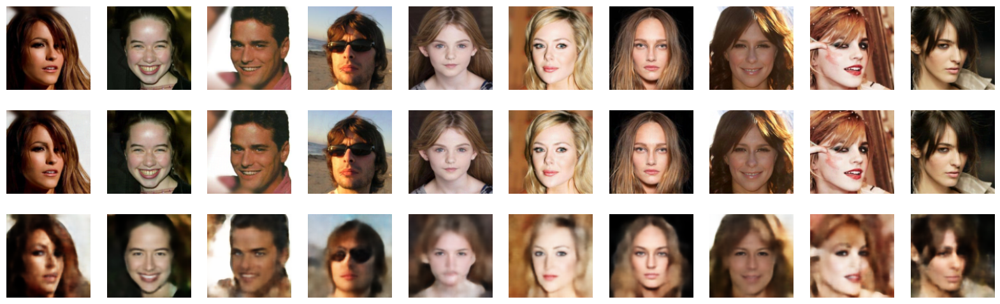

In [ ]:
# Test reconstruction of our proposed model under PGD attack
# The model uses the exponential increasing temperature strategy
# Attack intensity is 0.01
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

# Define the PGD attack function
def pgd_attack(model, image, epsilon, alpha, num_iter):
    perturbed_image = image.clone().detach()
    perturbed_image.requires_grad = True

    for _ in range(num_iter):
        outputs = model(perturbed_image)[0]
        loss = F.mse_loss(outputs, image)

        model.zero_grad()
        loss.backward()

        with torch.no_grad():
            perturbed_image = perturbed_image + alpha * perturbed_image.grad.sign()
            perturbed_image = torch.clamp(perturbed_image, image - epsilon, image + epsilon)
            perturbed_image = torch.clamp(perturbed_image, 0, 1)

        perturbed_image.requires_grad = True

    return perturbed_image

# Parameters for the PGD attack
epsilon = 0.01  # maximum perturbation
alpha = 0.01   # step size
num_iter = 40  # number of iterations

best_model = models[best_model_idx]
best_model.eval()

data, _ = next(iter(test_loader))
data = data.to(device)

# Call PGD Attack
perturbed_data = pgd_attack(best_model, data, epsilon, alpha, num_iter)

# Reconstruct images using the best model
recon_batch = best_model(perturbed_data)[0]

# Plot the original, adversarial, and reconstructed images
plt.figure(figsize=(20, 6))
for i in range(10):
    # Original images
    ax = plt.subplot(3, 10, i + 1)
    plt.imshow(data[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

    # Adversarial examples
    ax = plt.subplot(3, 10, i + 11)
    plt.imshow(perturbed_data[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

    # Reconstructed images
    ax = plt.subplot(3, 10, i + 21)
    plt.imshow(recon_batch[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

plt.show()


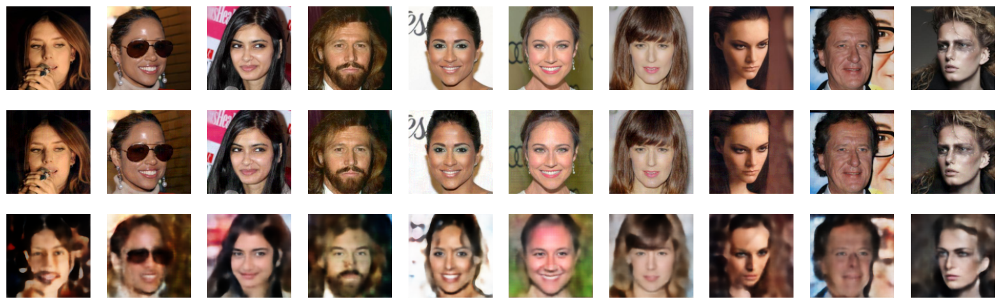

In [ ]:
# Test reconstruction of our proposed model under PGD attack
# The model uses the exponential increasing temperature strategy
# Attack intensity is 0.02
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

# Define the PGD attack function
def pgd_attack(model, image, epsilon, alpha, num_iter):
    perturbed_image = image.clone().detach()
    perturbed_image.requires_grad = True

    for _ in range(num_iter):
        outputs = model(perturbed_image)[0]
        loss = F.mse_loss(outputs, image)

        model.zero_grad()
        loss.backward()

        with torch.no_grad():
            perturbed_image = perturbed_image + alpha * perturbed_image.grad.sign()
            perturbed_image = torch.clamp(perturbed_image, image - epsilon, image + epsilon)
            perturbed_image = torch.clamp(perturbed_image, 0, 1)

        perturbed_image.requires_grad = True

    return perturbed_image

# Parameters for the PGD attack
epsilon = 0.02  # maximum perturbation
alpha = 0.01   # step size
num_iter = 40  # number of iterations

best_model = models[best_model_idx]
best_model.eval()

data, _ = next(iter(test_loader))
data = data.to(device)

# Call PGD Attack
perturbed_data = pgd_attack(best_model, data, epsilon, alpha, num_iter)

# Reconstruct images using the best model
recon_batch = best_model(perturbed_data)[0]

# Plot the original, adversarial, and reconstructed images
plt.figure(figsize=(20, 6))
for i in range(10):
    # Original images
    ax = plt.subplot(3, 10, i + 1)
    plt.imshow(data[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

    # Adversarial examples
    ax = plt.subplot(3, 10, i + 11)
    plt.imshow(perturbed_data[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

    # Reconstructed images
    ax = plt.subplot(3, 10, i + 21)
    plt.imshow(recon_batch[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

plt.show()
